Copyright 2015-2025 Universidad Complutense de Madrid (UCM)

This file contains code adapted from Numina https://github.com/guaix-ucm/numina.

It was developed by N. Cardiel for students of the Astrophysics Master (UCM).

This is an adapted version for lectures at ULS (Chile).

* License:
SPDX-License-Identifier: GPL-3.0+

* Modified by:
C. Cabello (UCM; Spain), 
L. Costantin (CAB; Spain)

## Check data

**It is good practice having a copy of all raw data.**

### Imports

In [7]:
'''
:Settings:
conda activate uls_2025

:History:
23 Mar 25:  version 1.0
'''

import os
import glob
import numpy as np
import teareduce as tea
import matplotlib.pyplot as plt

import ccdproc
from pathlib import Path
from astropy.io import fits
from ccdproc import ImageFileCollection
from astropy.stats import sigma_clipped_stats

tea.avoid_astropy_warnings(True)

__version__ = "1.0"
__author__  = "Cristina Cabello (UCM, Spain) and Luca Costantin (CAB, Spain)"


### Read data

In [8]:
galaxy_ID = 'NGC2366'

## MODIFY THE FOLLOWING

abs_path = f'NGC2366Workshop/{galaxy_ID}'

dir_data = Path(f'./data/spectroscopy/')


Rename files based on filename keyword.

In [9]:
input_files = sorted(glob.glob(f'{dir_data}/*.fits'))
for file in input_files:
    with fits.open(file) as hdu:
        k_filename = hdu[0].header['FILENAME']
    base_name = os.path.dirname(file)
    os.rename(file, os.path.join(base_name, k_filename))


In [11]:
## Select keywords that I want to read

selected_keywords = ['NAXIS1', 'NAXIS2', 'OBJECT' ,'IMAGETYP', 'EXPTIME' , 
                     'INSFLID', 'DATE-OBS', 'FILTER']

## Read all *cal* files and print the info

ifc_calib = ImageFileCollection(location=f'{dir_data}',
                                glob_include='cali*.fits',
                                keywords=selected_keywords)

summary_calib = tea.ifc_statsummary(ifc_calib, dir_data)
summary_calib.show_in_notebook()

  0%|          | 0/35 [00:00<?, ?it/s]

DataGrid(auto_fit_params={'area': 'all', 'padding': 30, 'numCols': None}, corner_renderer=None, default_render…

In [12]:
## Create different tables for *cal*: bias, domeflat, arc

matches_bias = ['bias' in object_name.lower() for object_name in ifc_calib.summary['OBJECT']]
summary_bias = summary_calib[matches_bias]

matches_domeflat = ['flat' in object_name.lower() for object_name in ifc_calib.summary['IMAGETYP']]
summary_domeflat = summary_calib[matches_domeflat]

matches_arc = ['arc' in object_name.lower() for object_name in ifc_calib.summary['IMAGETYP']]
summary_arc = summary_calib[matches_arc]

### Plot bias

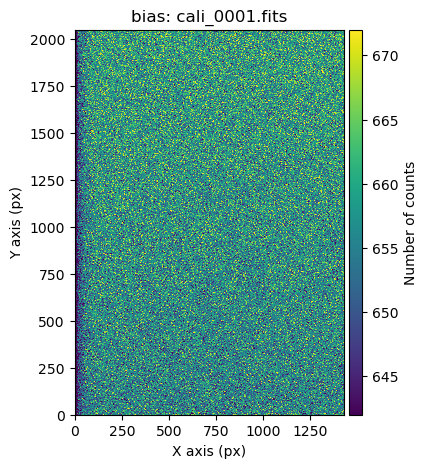

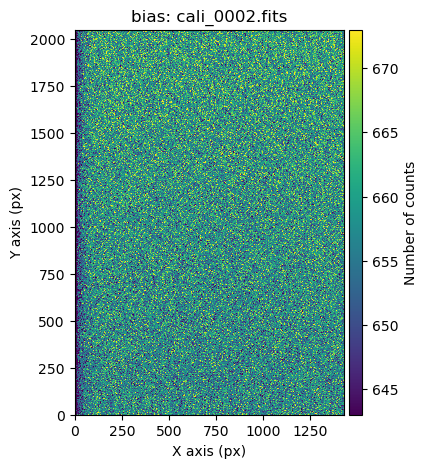

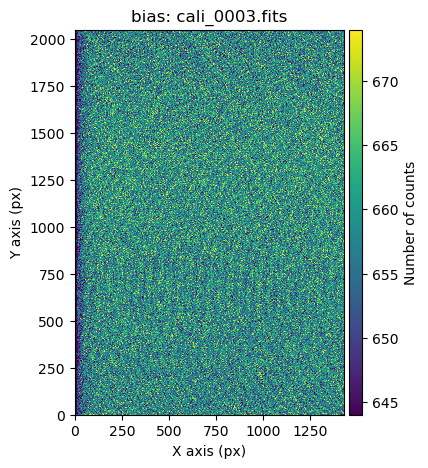

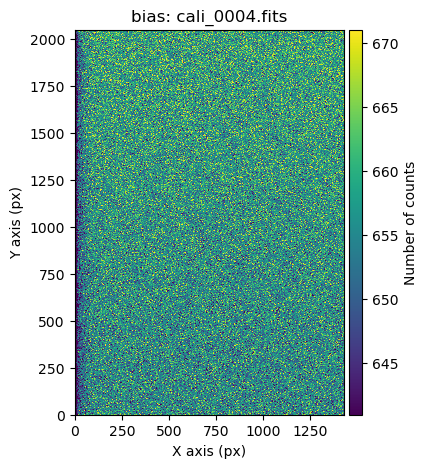

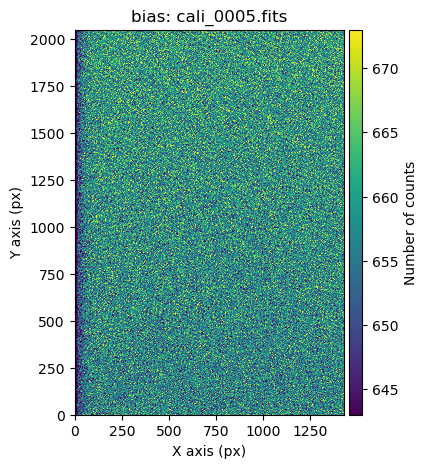

...

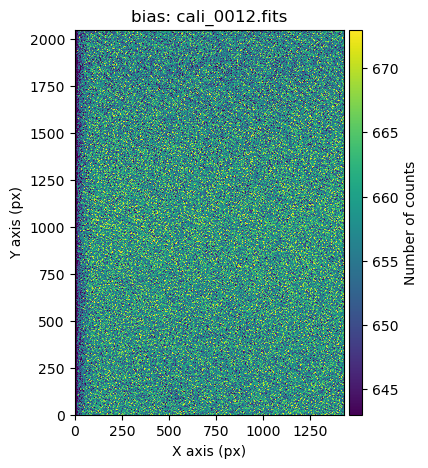

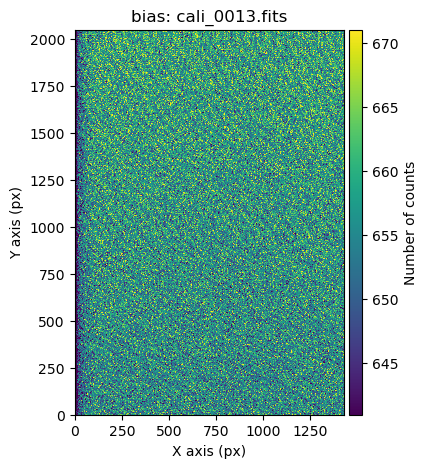

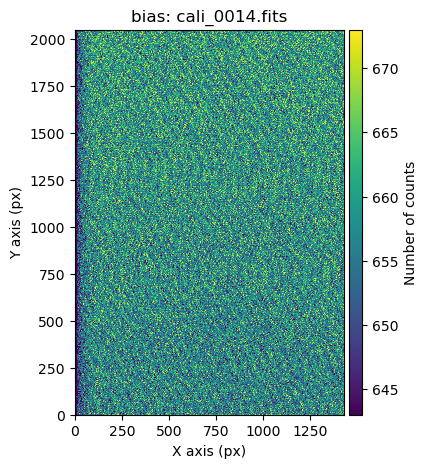

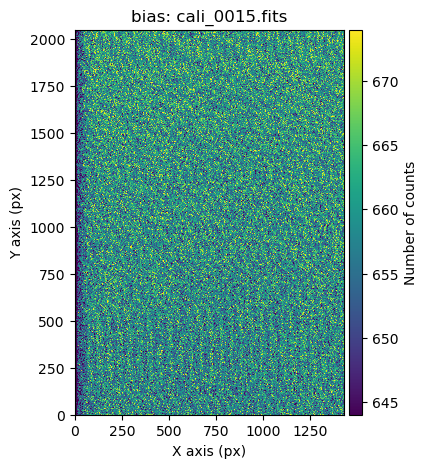

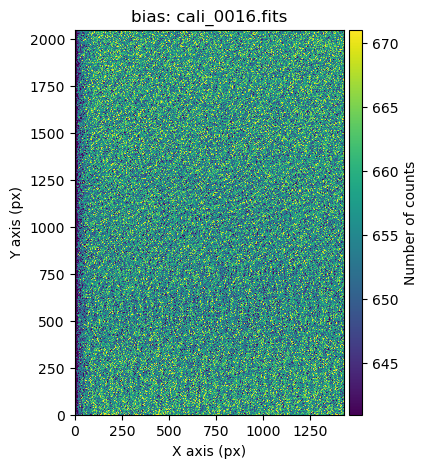

In [14]:
## Show all frames or just the first one
show_all = True

for filename in summary_bias['file']:

    data = fits.getdata(dir_data / filename)
    vmin = np.median(data) - 15
    vmax = np.median(data) + 15
    
    if (show_all == True):
        fig, ax = plt.subplots(figsize=(15, 5))
        tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
        ax.set_title(f'bias: {filename}')
        ax.set_xlabel('X axis (px)')
        ax.set_ylabel('Y axis (px)')
        plt.show()

    else:
        fig, ax = plt.subplots(figsize=(15, 5))
        tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
        ax.set_xlabel('X axis (px)')
        ax.set_ylabel('Y axis (px)')
        ax.set_title(f'bias: {filename}')
        plt.show()
        break

### Plot domeflat

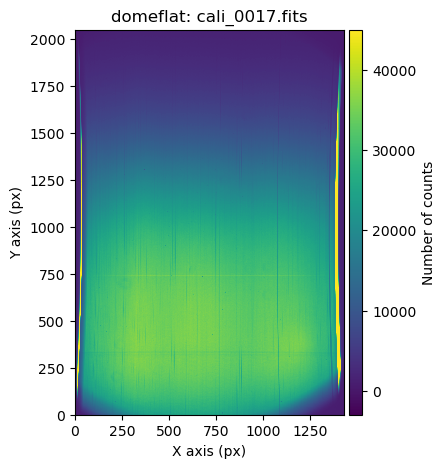

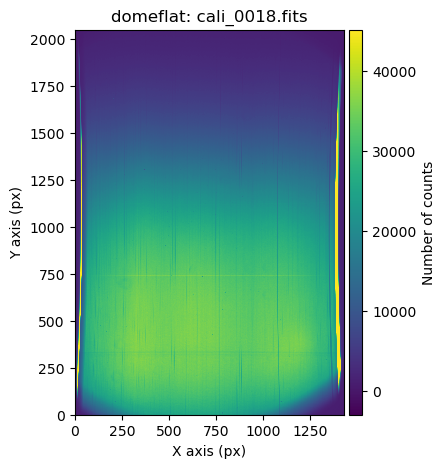

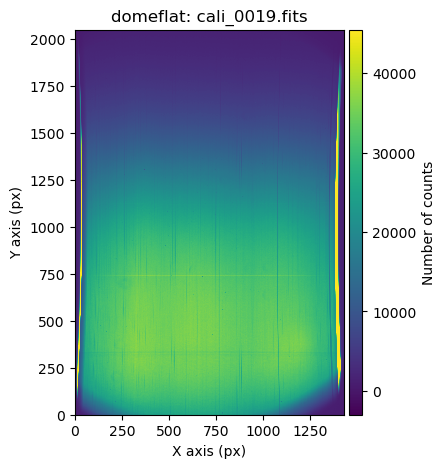

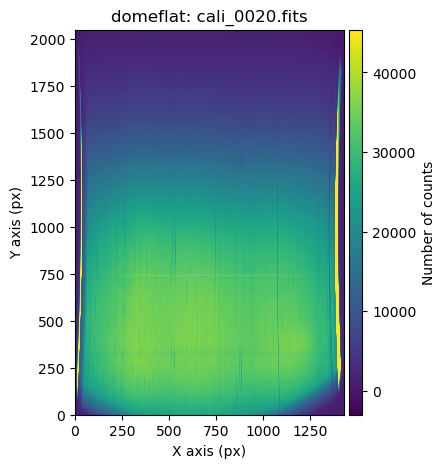

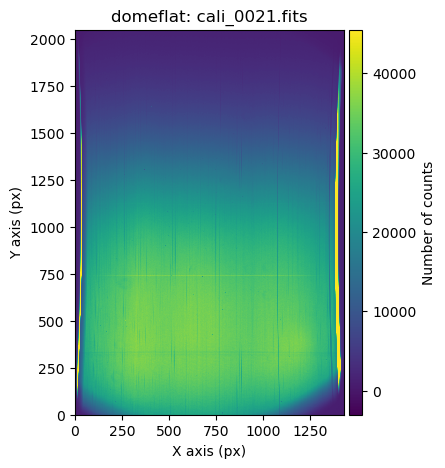

...

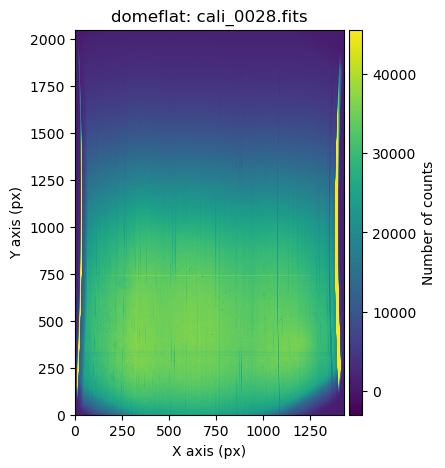

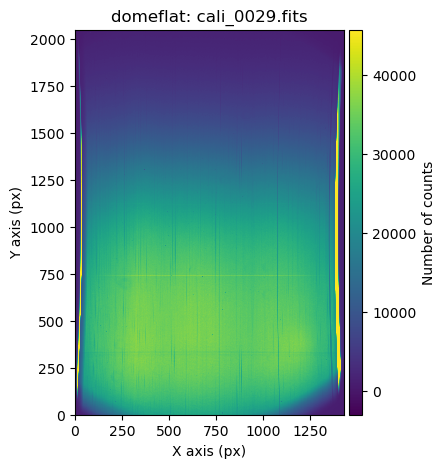

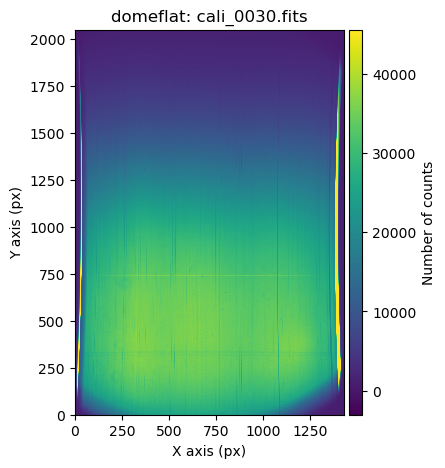

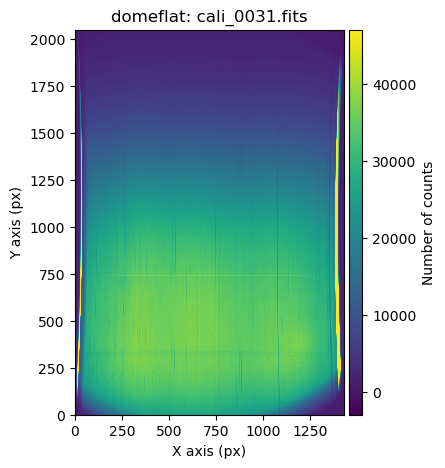

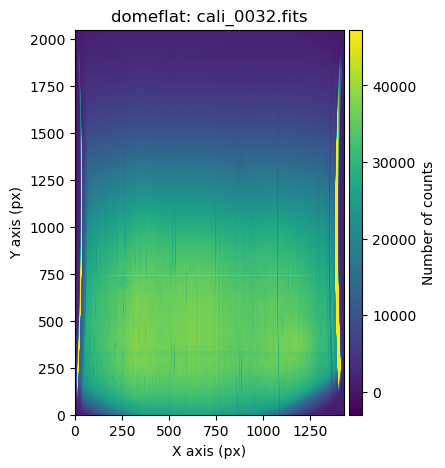

In [15]:
## Show all frames or just the first one
show_all = True

for filename in summary_domeflat['file']:
    data = fits.getdata(dir_data / filename)
    mean, median, std = sigma_clipped_stats(data, sigma=3.0)
    vmin = median - 2 * std
    vmax = median + 2 * std

    if (show_all == True):
        fig, ax = plt.subplots(figsize=(15, 5))
        tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
        ax.set_xlabel('X axis (px)')
        ax.set_ylabel('Y axis (px)')
        ax.set_title(f'domeflat: {filename}')
        plt.show()
    else:
        fig, ax = plt.subplots(figsize=(15, 5))
        tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
        ax.set_xlabel('X axis (px)')
        ax.set_ylabel('Y axis (px)')
        ax.set_title(f'domeflat: {filename}')
        plt.show()
        break


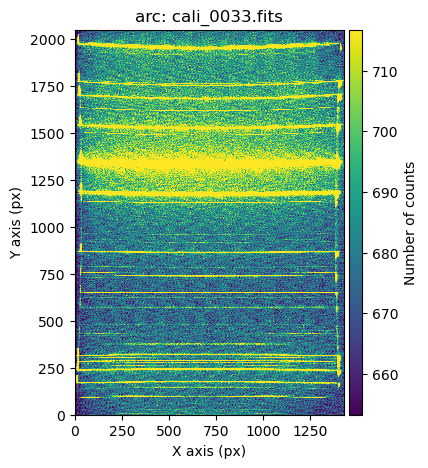

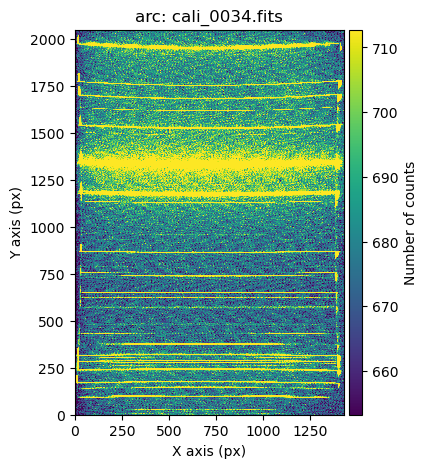

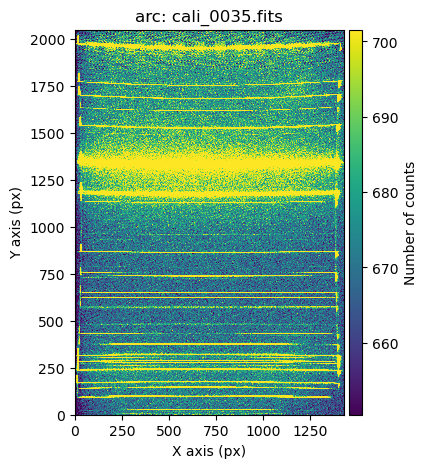

In [16]:
## Show all frames or just the first one
show_all = True

for filename in summary_arc['file']:
    data = fits.getdata(dir_data / filename)
    mean, median, std = sigma_clipped_stats(data, sigma=3.0)
    vmin = median - 2 * std
    vmax = median + 2 * std

    if (show_all == True):
        fig, ax = plt.subplots(figsize=(15, 5))
        tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
        ax.set_xlabel('X axis (px)')
        ax.set_ylabel('Y axis (px)')
        ax.set_title(f'arc: {filename}')
        plt.show()
    else:
        fig, ax = plt.subplots(figsize=(15, 5))
        tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
        ax.set_xlabel('X axis (px) --> spatial direction')
        ax.set_ylabel('Y axis (px) --> spectral direction')
        ax.set_title(f'arc: {filename}')
        plt.show()
        break


### Raw spectra: target and spectro-photometric star

In [17]:
## Read all *target* files and print the info
## We use the same keywords as for the *cal* files

ifc_target = ImageFileCollection(location=f'{dir_data}',
                                 glob_include='science_*.fits',
                                 keywords=selected_keywords)

summary_target = tea.ifc_statsummary(ifc_target, dir_data)
summary_target.show_in_notebook()


  0%|          | 0/4 [00:00<?, ?it/s]

DataGrid(auto_fit_params={'area': 'all', 'padding': 30, 'numCols': None}, corner_renderer=None, default_render…

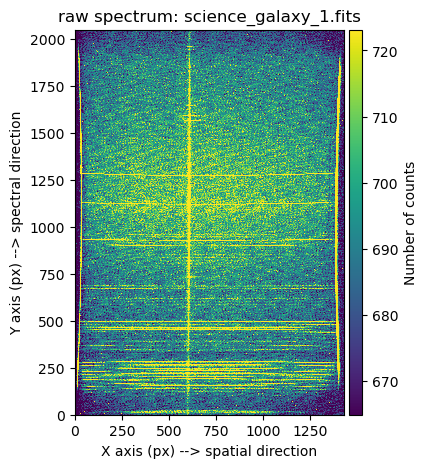

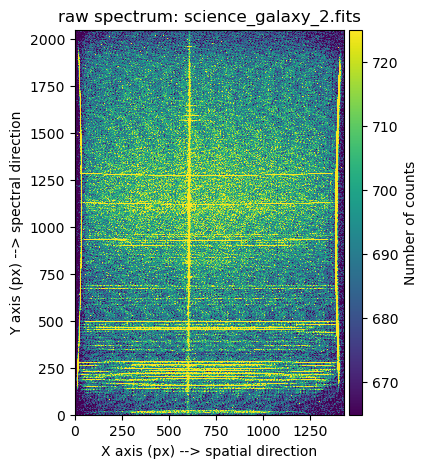

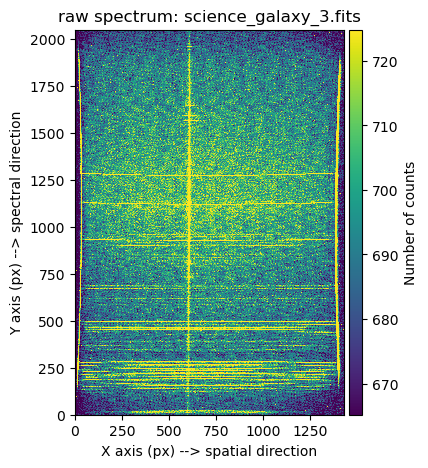

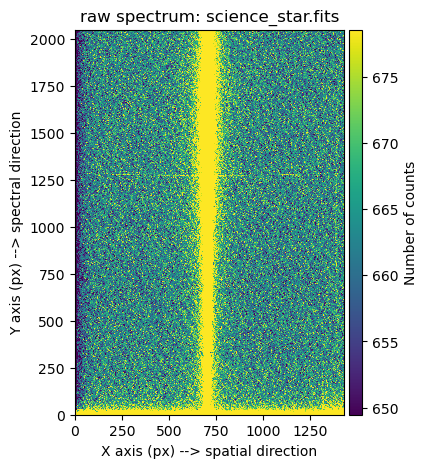

In [18]:
## Show all frames or just the first one
show_all = True

for filename in summary_target['file']:
    data = fits.getdata(dir_data / filename)
    mean, median, std = sigma_clipped_stats(data, sigma=3.0)
    vmin = median - 2 * std
    vmax = median + 2 * std

    if (show_all == True):
        fig, ax = plt.subplots(figsize=(15, 5))
        tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
        ax.set_xlabel('X axis (px) --> spatial direction')
        ax.set_ylabel('Y axis (px) --> spectral direction')
        ax.set_title(f'raw spectrum: {filename}')
        plt.show()
    else:
        fig, ax = plt.subplots(figsize=(15, 5))
        tea.imshow(fig, ax, data, vmin=vmin, vmax=vmax)
        ax.set_xlabel('X axis (px) --> spatial direction')
        ax.set_ylabel('Y axis (px) --> spectral direction')
        ax.set_title(f'raw spectrum: {filename}')
        plt.show()
        break
